In [1]:
#Input questions
import json

household_finance_list, recreation_list, services_list, claude_recreation_list, claude_household_finance_list, claude_services_list = [],[],[],[],[],[]
no_topic_list, claude_no_topic_list = [],[]

with open(r"C:\Users\Amin\A-Star-AI-for-education\AStar Internship - Question\Data\Generated_questions\GPT4.1\All\householdfinance\householdfinance_v8_v1.json","r") as file:
    household_finance_json = json.load(file)
with open(r"C:\Users\Amin\A-Star-AI-for-education\AStar Internship - Question\Data\Generated_questions\GPT4.1\All\recreation\recreation_v8_v1.json", "r") as file:
    recreation_json = json.load(file)
with open(r"C:\Users\Amin\A-Star-AI-for-education\AStar Internship - Question\Data\Generated_questions\GPT4.1\All\services\services_v8_v1.json","r") as file:
    services_json = json.load(file)
with open(r"C:\Users\Amin\A-Star-AI-for-education\AStar Internship - Question\Data\Evaluated_questions\GPT4.1\All\no topic\gpt_no_topic.json", "r") as file:
    no_topic_json = json.load(file)
with open(r"C:\Users\Amin\A-Star-AI-for-education\AStar Internship - Question\Data\Generated_questions\Claude4\All\recreation\recreation_v3_split.json","r") as file:
    claude_recreation_json = json.load(file)
with open(r"C:\Users\Amin\A-Star-AI-for-education\AStar Internship - Question\Data\Generated_questions\Claude4\All\householdfinance\householdfinance_v3.json","r") as file:
    claude_household_finance_json = json.load(file)
with open(r"C:\Users\Amin\A-Star-AI-for-education\AStar Internship - Question\Data\Generated_questions\Claude4\All\services\services_v3.json", "r") as file:
    claude_services_json = json.load(file)
with open(r"C:\Users\Amin\A-Star-AI-for-education\AStar Internship - Question\Data\Evaluated_questions\Claude4\All\no topic\claude_no_topic.json","r") as file:
    claude_no_topic_json = json.load(file)

for qid, qn_data in household_finance_json.items():
    household_finance_list.append(qn_data['response_dict']['word_problem'])
for qid, qn_data in recreation_json.items():
    recreation_list.append(qn_data['response_dict']['word_problem'])
for qid, qn_data in services_json.items():
    services_list.append(qn_data['response_dict']['word_problem'])
for qid, qn_data in no_topic_json.items():
    no_topic_list.append(qn_data['response_dict']['word_problem'])
for evaluator, qn in claude_recreation_json.items():
    for qid, qn_data in qn.items():
        claude_recreation_list.append(qn_data['response_dict']['word_problem'])
for qid, qn_data in claude_household_finance_json.items():
    claude_household_finance_list.append(qn_data['response_dict']['word_problem'])
for qid, qn_data in claude_services_json.items():
    claude_services_list.append(qn_data['response_dict']['word_problem'])
for qid, qn_data in claude_no_topic_json.items():
    claude_no_topic_list.append(qn_data['response_dict']['word_problem'])

topics = [household_finance_list,recreation_list,services_list,no_topic_list,claude_household_finance_list,claude_recreation_list,claude_services_list,claude_no_topic_list]
topic_names = ['GPT Household Finance', 'GPT Recreation', 'GPT Services','GPT No Topic', 'Claude Household Finance','Claude Recreation','Claude Services','Claude No Topic']

# Flag embedding for sentence diversity analysis

In [2]:
from sentence_transformers import SentenceTransformer
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Combine all paragraphs into one list
#plot1: GPT with topics vs Claude with topics
#plot2: GPT with and without topics
#plot3: Claude with and without topics
#plot4: All generated questions together
plot1, plot2, plot3, plotall = [], [], [], []
for i in range(len(topics)):
    if i in (0,1,2,4,5,6):
        plot1.extend(topics[i])
    if i in (0,1,2,3):
        plot2.extend(topics[i])
    if i in (4,5,6,7):
        plot3.extend(topics[i])
    plotall.extend(topics[i])
print(len(plot1), len(plot2), len(plot3))
    
# Keep track of labels
labels1 = ([0] * len(household_finance_list)) + ([1] * len(recreation_list)) + ([2] * len(services_list))
labels1 = labels1 + ([4] * len(claude_household_finance_list)) + ([5] * len(claude_recreation_list)) + ([6] * len(claude_services_list))
labels2 = ([0] * len(household_finance_list)) + ([1] * len(recreation_list)) + ([2] * len(services_list)) + ([3] * len(no_topic_list))
labels3 = ([4] * len(claude_household_finance_list)) + ([5] * len(claude_recreation_list)) + ([6] * len(claude_services_list)) + ([7] * len(claude_no_topic_list))
labelsall = ([0] * len(household_finance_list)) + ([1] * len(recreation_list)) + ([2] * len(services_list)) + ([3] * len(no_topic_list))
labelsall = labelsall + ([4] * len(claude_household_finance_list)) + ([5] * len(claude_recreation_list)) + ([6] * len(claude_services_list)) + ([7] * len(claude_no_topic_list))
# Load model
model = SentenceTransformer("BAAI/bge-small-en-v1.5")

# Encode all paragraphs
embeddings1 = model.encode(plot1)
embeddings2 = model.encode(plot2)
embeddings3 = model.encode(plot3)
embeddingsall = model.encode(plotall)

1056 704 704


In [3]:
household_finance_vectors = model.encode(household_finance_list)
recreation_vectors = model.encode(recreation_list)
services_vectors = model.encode(services_list)
no_topic_vectors = model.encode(no_topic_list)
claude_recreation_vectors = model.encode(claude_recreation_list)
claude_household_finance_vectors = model.encode(claude_household_finance_list)
claude_services_vectors = model.encode(claude_services_list)
claude_no_topic_vectors = model.encode(claude_no_topic_list)
vectors_list = [household_finance_vectors,recreation_vectors,services_vectors,no_topic_vectors,claude_household_finance_vectors,
                claude_recreation_vectors,claude_services_vectors,claude_no_topic_vectors]
print(type(household_finance_vectors), household_finance_vectors[:5])

<class 'numpy.ndarray'> [[-4.18524444e-02 -4.70400341e-02 -1.09165697e-03 ...  3.80691290e-02
  -3.55077698e-03  1.78935449e-03]
 [-7.84150735e-02 -1.93584785e-02 -6.79341285e-03 ... -1.53415212e-02
  -1.07013779e-02  4.24700454e-02]
 [-4.90782447e-02 -1.10433931e-02  6.80896314e-03 ...  3.76476832e-02
   1.51600987e-02  5.41367009e-03]
 [-2.38495003e-02 -4.34391154e-03 -4.57644500e-02 ...  1.63682271e-02
   1.05241565e-02  3.67516442e-03]
 [-3.40076238e-02  1.59217091e-03 -4.44557406e-02 ... -1.02985587e-05
   3.67437154e-02 -3.64834862e-03]]


## t-SNE for question embeddings - relative distance between questions

### Inter-topics

In [4]:
# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, perplexity = 3, random_state=42)
reduced1 = tsne.fit_transform(embeddings1)
reduced2 = tsne.fit_transform(embeddings2)
reduced3 = tsne.fit_transform(embeddings3)
reducedall = tsne.fit_transform(embeddingsall)

In [5]:
labelsall = ([0] * len(household_finance_list)) + ([1] * len(recreation_list)) + ([2] * len(services_list)) + ([3] * len(no_topic_list))
labelsall = labelsall + ([4] * len(claude_household_finance_list)) + ([5] * len(claude_recreation_list)) + ([6] * len(claude_services_list)) + ([7] * len(claude_no_topic_list))
# Load model

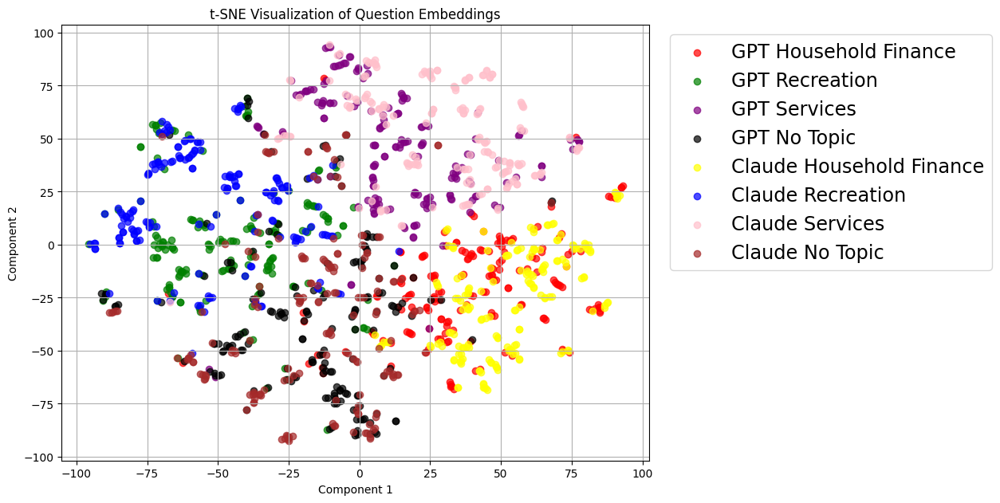

In [6]:
# Plotting
colors = ['red', 'green', 'purple', 'black', 'yellow', 'blue', 'pink',  'brown']

plt.figure(figsize=(15, 6))
for i in range(len(set(labelsall))):
    indices = [j for j, label in enumerate(labelsall) if label == i]
    plt.scatter(reducedall[indices, 0], reducedall[indices, 1], c=colors[i], label=topic_names[i], alpha = 0.7)

plt.legend(fontsize='xx-large', bbox_to_anchor=(1.6, 1), loc='upper right')
plt.tight_layout()
plt.title("t-SNE Visualization of Question Embeddings")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.grid(True)
plt.show()

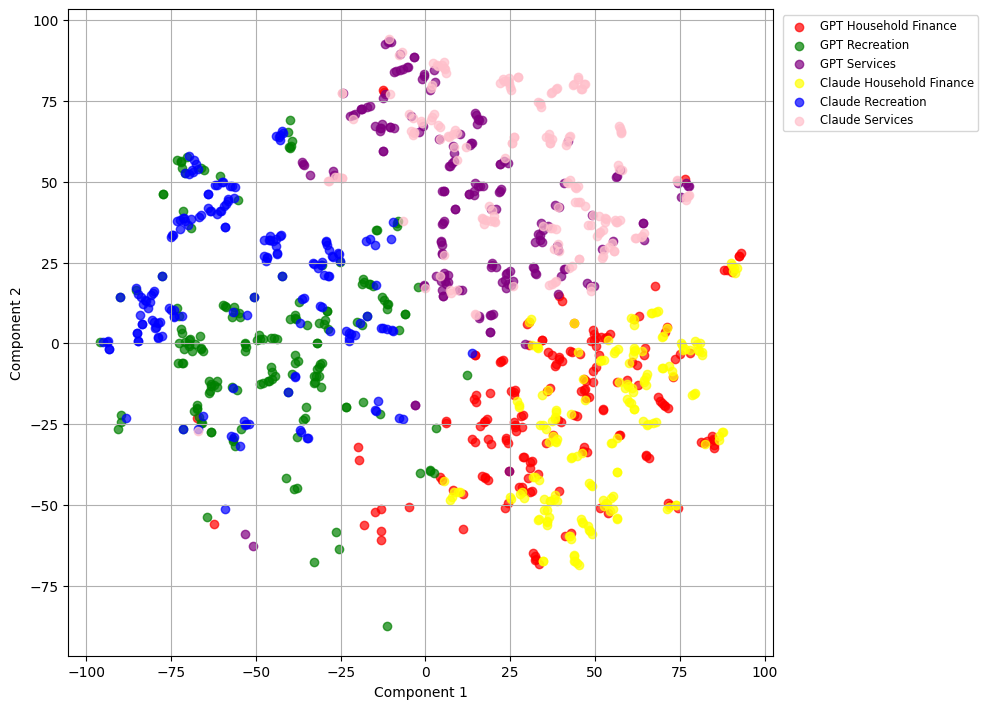

In [7]:
# Plotting
colors = ['red', 'green', 'purple', 'black', 'yellow', 'blue', 'pink',  'brown']

plt.figure(figsize=(10, 7))
for i in (0,1,2,4,5,6):
    indices = [j for j, label in enumerate(labelsall) if label == i]
    plt.scatter(reducedall[indices, 0], reducedall[indices, 1], c=colors[i], label=topic_names[i], alpha = 0.7)

plt.legend(fontsize='small', bbox_to_anchor=(1.3, 1), loc='upper right')
plt.tight_layout()
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.grid(True)
plt.show()

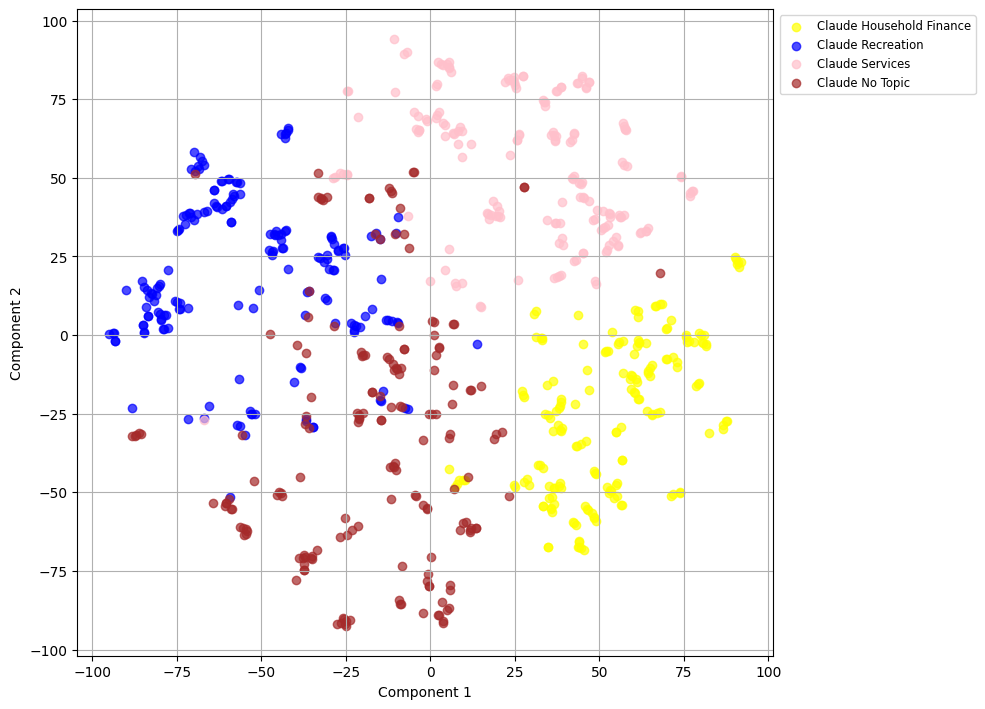

In [8]:
# Plotting
colors = ['red', 'green', 'purple', 'black', 'yellow', 'blue', 'pink',  'brown']

plt.figure(figsize=(10, 7))
for i in (4,5,6,7):
    indices = [j for j, label in enumerate(labelsall) if label == i]
    plt.scatter(reducedall[indices, 0], reducedall[indices, 1], c=colors[i], label=topic_names[i], alpha = 0.7)

plt.legend(fontsize='small', bbox_to_anchor=(1.3, 1), loc='upper right')
plt.tight_layout()
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.grid(True)
plt.show()

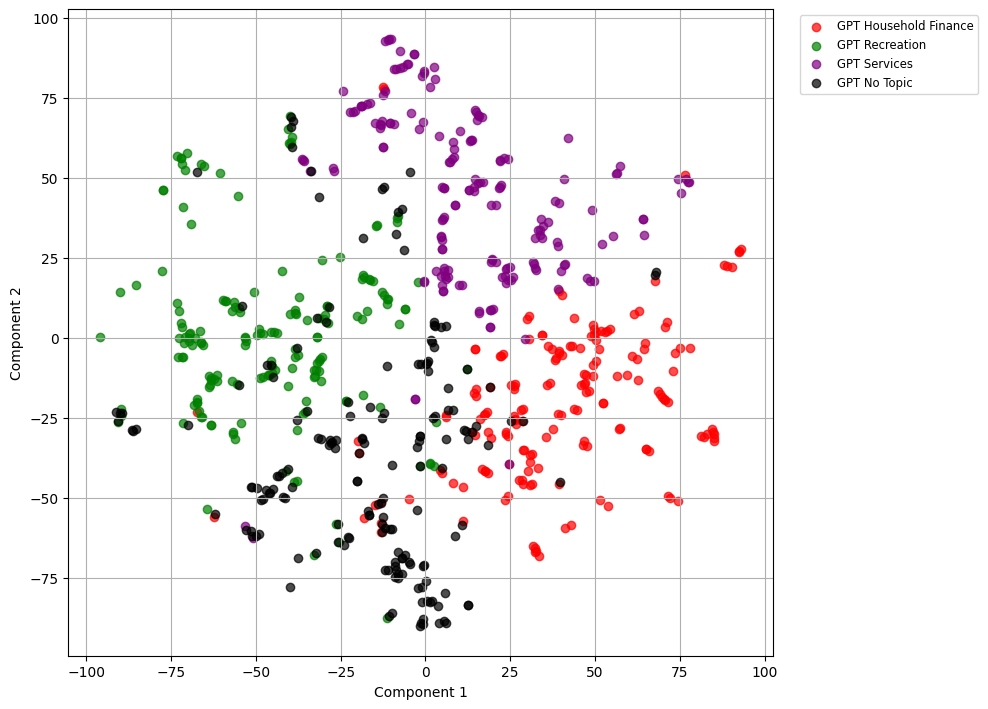

In [9]:
# Plotting
colors = ['red', 'green', 'purple', 'black', 'yellow', 'blue', 'pink',  'brown']

plt.figure(figsize=(10, 7))
for i in (0,1,2,3):
    indices = [j for j, label in enumerate(labelsall) if label == i]
    plt.scatter(reducedall[indices, 0], reducedall[indices, 1], c=colors[i], label=topic_names[i], alpha = 0.7)

plt.legend(fontsize='small', bbox_to_anchor=(1.3, 1), loc='upper right')
plt.tight_layout()
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.grid(True)
plt.show()

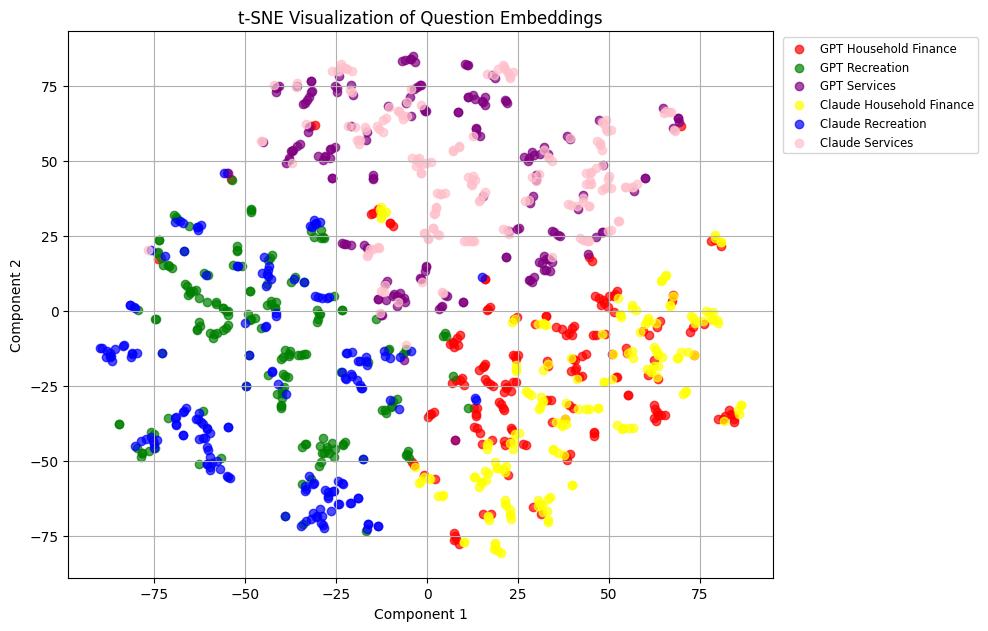

In [10]:
# Plotting
colors = ['red', 'green', 'purple', 'black', 'yellow', 'blue', 'pink',  'brown']

plt.figure(figsize=(10, 6))
for i in set(labels1):
    indices = [j for j, label in enumerate(labels1) if label == i]
    plt.scatter(reduced1[indices, 0], reduced1[indices, 1], c=colors[i], label=topic_names[i], alpha = 0.7)

plt.legend(fontsize='small', bbox_to_anchor=(1.3, 1), loc='upper right')
plt.tight_layout()
plt.title("t-SNE Visualization of Question Embeddings")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.grid(True)
plt.show()

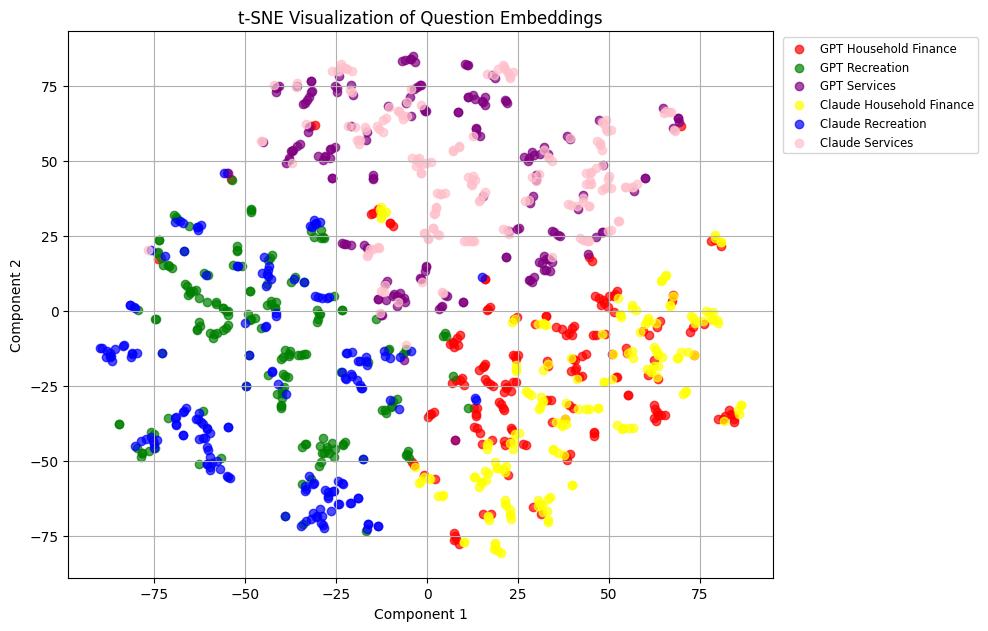

In [11]:
# Plotting
colors = ['red', 'green', 'purple', 'black', 'yellow', 'blue', 'pink',  'brown']

plt.figure(figsize=(10, 6))
for i in set(labels1):
    indices = [j for j, label in enumerate(labels1) if label == i]
    plt.scatter(reduced1[indices, 0], reduced1[indices, 1], c=colors[i], label=topic_names[i], alpha = 0.7)

plt.legend(fontsize='small', bbox_to_anchor=(1.3, 1), loc='upper right')
plt.tight_layout()
plt.title("t-SNE Visualization of Question Embeddings")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.grid(True)
plt.show()

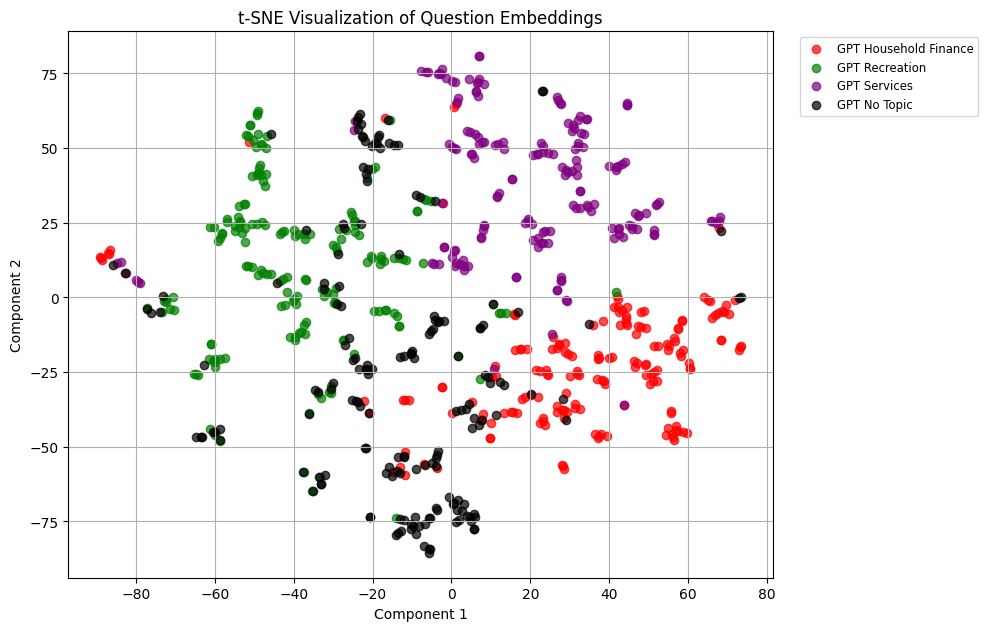

In [12]:
# Plotting
colors = ['red', 'green', 'purple', 'black', 'yellow', 'blue', 'pink',  'brown']

plt.figure(figsize=(10, 6))
for i in set(labels2):
    indices = [j for j, label in enumerate(labels2) if label == i]
    plt.scatter(reduced2[indices, 0], reduced2[indices, 1], c=colors[i], label=topic_names[i], alpha = 0.7)

plt.legend(fontsize='small', bbox_to_anchor=(1.3, 1), loc='upper right')
plt.tight_layout()
plt.title("t-SNE Visualization of Question Embeddings")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.grid(True)
plt.show()

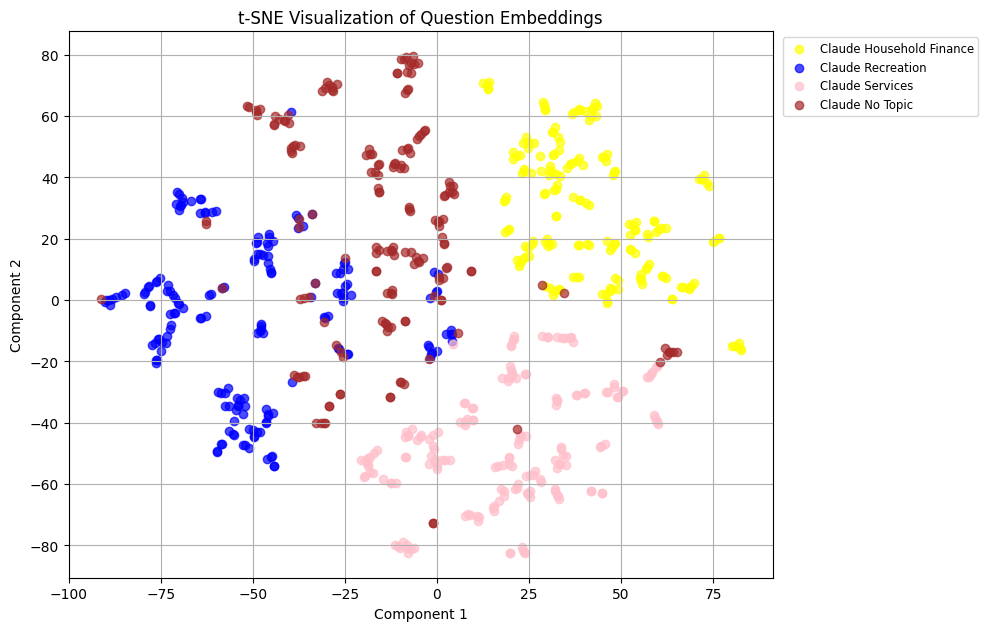

In [13]:
# Plotting
colors = ['red', 'green', 'purple', 'black', 'yellow', 'blue', 'pink',  'brown']

plt.figure(figsize=(10, 6))
for i in set(labels3):
    indices = [j for j, label in enumerate(labels3) if label == i]
    plt.scatter(reduced3[indices, 0], reduced3[indices, 1], c=colors[i], label=topic_names[i], alpha = 0.7)

plt.legend(fontsize='small', bbox_to_anchor=(1.3, 1), loc='upper right')
plt.tight_layout()
plt.title("t-SNE Visualization of Question Embeddings")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.grid(True)
plt.show()

### Intra-topic

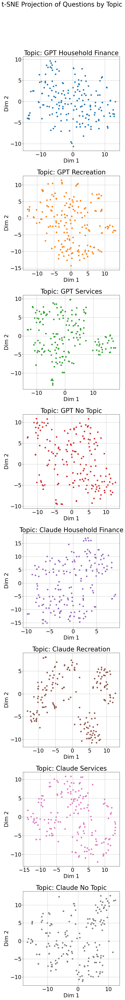

In [23]:
import matplotlib.pyplot as plt
fig, axes = plt.subplots(8, 1, figsize=(8, 64))
fig.suptitle("t-SNE Projection of Questions by Topic")

for i, (vector, name) in enumerate(zip(vectors_list, topic_names)):
    tsne = TSNE(n_components=2, random_state=42)
    reduced = tsne.fit_transform(vector)

    ax = axes[i]
    ax.scatter(reduced[:, 0], reduced[:, 1], color='C'+str(i))
    ax.set_title(f"Topic: {name}")
    ax.set_xlabel("Dim 1")
    ax.set_ylabel("Dim 2")
    ax.grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Leave space for suptitle
plt.rcParams.update({'font.size': 24})
plt.show()

In [17]:
axes

array([[<Axes: >, <Axes: >, <Axes: >],
       [<Axes: >, <Axes: >, <Axes: >]], dtype=object)

## Manually find out what the sub-clusters in services and claude recreation are

In [22]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def manual_inspection(vct, lst, x_max = None, y_max = None, x_min = None, y_min = None):

    tsne = TSNE(n_components=2, random_state=42)
    reduced = tsne.fit_transform(vct)

    # Assuming you have embeddings and questions
    df = pd.DataFrame({
        'tsne_x': reduced[:, 0],
        'tsne_y': reduced[:, 1],
        'question_text': lst
    })

    filtered_df = df
    if x_min is not None:
        filtered_df = filtered_df[filtered_df['tsne_x']>=x_min]
    if x_max is not None:
        filtered_df = filtered_df[filtered_df['tsne_x']<=x_max]
    if y_min is not None:
        filtered_df = filtered_df[filtered_df['tsne_y']>=y_min]
    if y_max is not None:
        filtered_df = filtered_df[filtered_df['tsne_y']<=y_max]
        
    corresponding_list = list(filtered_df['question_text'])

    # Suppose `paragraphs` is your list of 176 paragraphs
    text = " ".join(corresponding_list)
    
    # Generate a word cloud object
    wordcloud = WordCloud(width=800, height=800, background_color='white').generate(text)
    
    # Display the generated image
    plt.figure(figsize=(6, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title("Word Cloud for sub-cluster", fontsize=16)
    plt.show()

    return filtered_df, corresponding_list

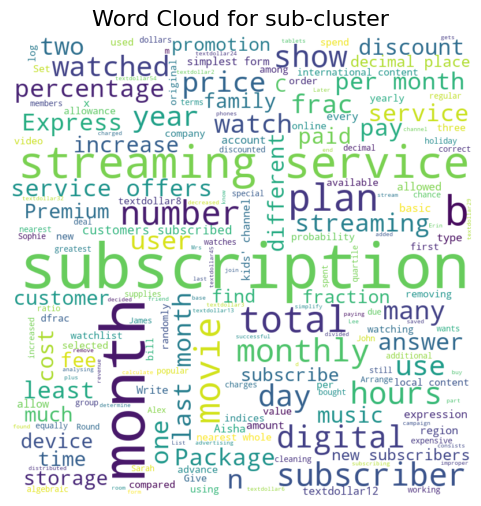

In [23]:
filtered_services_df, corresponding_services_list = manual_inspection(vct = services_vectors, lst = services_list, x_min = 9.7)

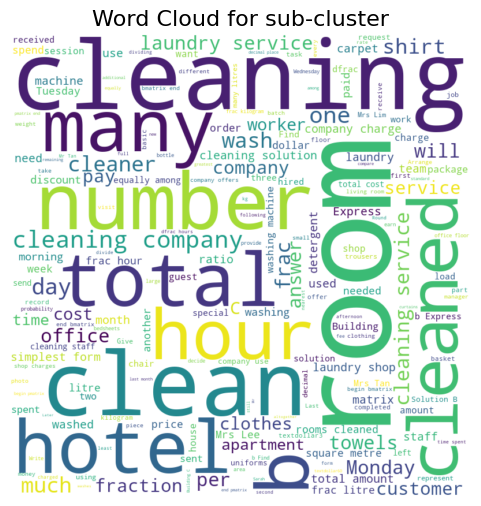

In [27]:
_1, _2 = manual_inspection(vct = services_vectors, lst = services_list, x_max = 9.7)

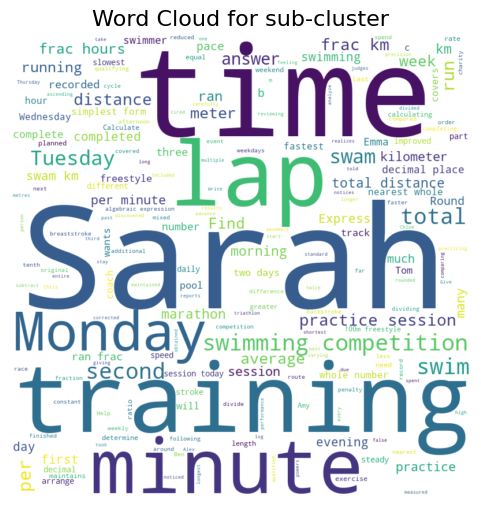

In [24]:
_1, _2 = manual_inspection(vct = claude_recreation_vectors, lst = claude_recreation_list, x_min = 5, y_min = -2.5)

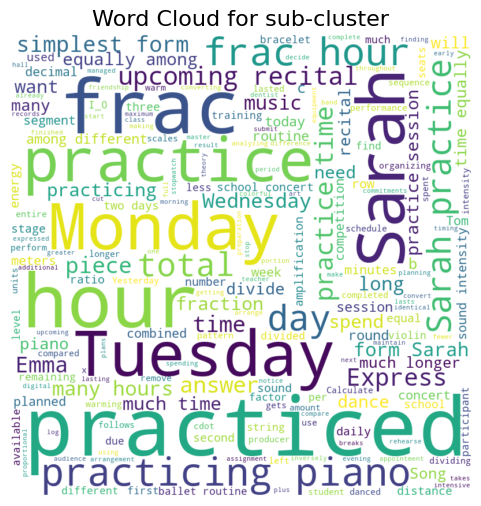

In [25]:
_1, _2 = manual_inspection(vct = claude_recreation_vectors, lst = claude_recreation_list, x_min = 0, y_max = -2.5)

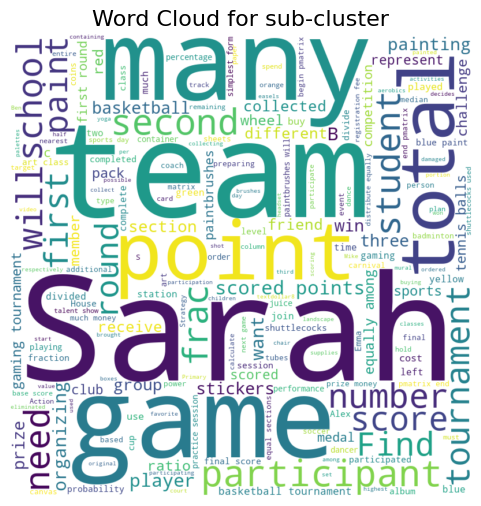

In [26]:
_1, _2 = manual_inspection(vct = claude_recreation_vectors, lst = claude_recreation_list, x_max = 5, y_min = -2.5)

## Cosine similarity between topics

In [24]:
from sklearn.metrics.pairwise import cosine_similarity

similarity_matrix = cosine_similarity(embeddings1)
print(similarity_matrix.shape)
topic_len = 176 #Length of one topic. Equals to number of KC pairs

(1056, 1056)


In [25]:
import numpy as np
#Calculate the mean similarities between question within each 176*176 blocks (corresponding to 176 questions of topic A to 176 questions of topic B)
block_size = 176
result = np.zeros((similarity_matrix.shape[0] // topic_len, similarity_matrix.shape[1] // topic_len))

for i in range(similarity_matrix.shape[0] // topic_len):  # row block
    for j in range(similarity_matrix.shape[1] // topic_len):  # column block
        block = similarity_matrix[i*block_size:(i+1)*block_size, j*block_size:(j+1)*block_size]
        result[i, j] = block.mean()

print(result)

[[0.74258626 0.64111733 0.66921276 0.74656802 0.62262213 0.65565288]
 [0.64111733 0.69598526 0.63116771 0.61678082 0.67539358 0.60514265]
 [0.66921276 0.63116771 0.70055676 0.65964478 0.61432576 0.68178993]
 [0.74656802 0.61678082 0.65964478 0.77946436 0.60732085 0.65518719]
 [0.62262219 0.67539358 0.61432582 0.60732085 0.68369639 0.59876436]
 [0.65565282 0.60514265 0.68178993 0.65518719 0.5987643  0.69896793]]


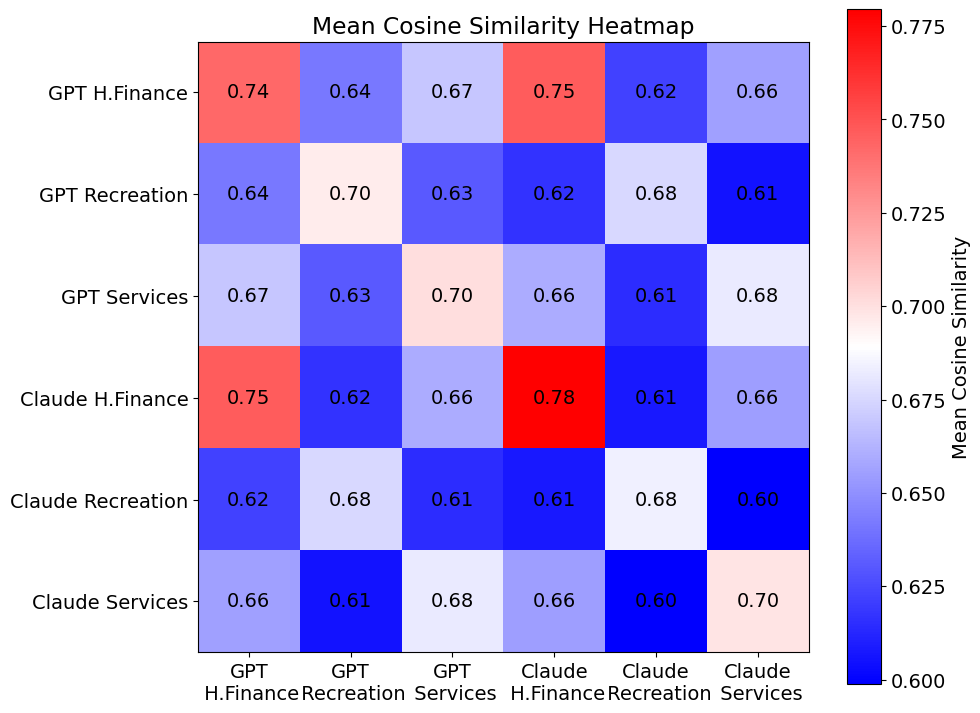

In [34]:
# Plot the heatmap
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 8))
plt.imshow(result, cmap='bwr', interpolation='nearest')
plt.title('Mean Cosine Similarity Heatmap')
plt.colorbar(label='Mean Cosine Similarity')

# Add text labels
for i in range(similarity_matrix.shape[0] // topic_len):  # row block
    for j in range(similarity_matrix.shape[1] // topic_len):  # column block
        plt.text(j, i, f"{result[i, j]:.2f}", ha='center', va='center', color='white' if result[i,j] < 0.5 else 'black')

plt.xticks(list(range(similarity_matrix.shape[1] // topic_len)), ['GPT\n H.Finance', 'GPT\n Recreation', 'GPT\n Services','Claude\n H.Finance','Claude\n Recreation','Claude\n Services'])
plt.yticks(list(range(similarity_matrix.shape[1] // topic_len)), ['GPT H.Finance', 'GPT Recreation', 'GPT Services','Claude H.Finance','Claude Recreation','Claude Services'])
plt.rcParams.update({'font.size': 16})
plt.tight_layout()
plt.show()

## Euclidean distance between topics

In [38]:
from sklearn.metrics.pairwise import euclidean_distances

similarity_matrix = euclidean_distances(embeddings1)
print(similarity_matrix.shape)

(1056, 1056)


In [39]:
import numpy as np
#Calculate the mean similarities between question within each 176*176 blocks (corresponding to 176 questions of topic A to 176 questions of topic B)
block_size = 176
result = np.zeros((similarity_matrix.shape[0] // topic_len, similarity_matrix.shape[1] // topic_len))

for i in range(similarity_matrix.shape[0] // topic_len):  # row block
    for j in range(similarity_matrix.shape[1] // topic_len):  # column block
        block = similarity_matrix[i*block_size:(i+1)*block_size, j*block_size:(j+1)*block_size]
        result[i, j] = block.mean()

print(result)

[[0.70927495 0.84406251 0.81011713 0.70647514 0.86613727 0.82627177]
 [0.84406251 0.77233237 0.85613585 0.87342596 0.80079997 0.88550425]
 [0.81011719 0.85613585 0.76472914 0.82246667 0.87591439 0.79119945]
 [0.70647514 0.87342596 0.82246679 0.65637231 0.88427848 0.82732749]
 [0.86613727 0.80079997 0.87591439 0.88427848 0.7846328  0.89261782]
 [0.82627171 0.88550425 0.79119951 0.82732749 0.89261782 0.76565504]]


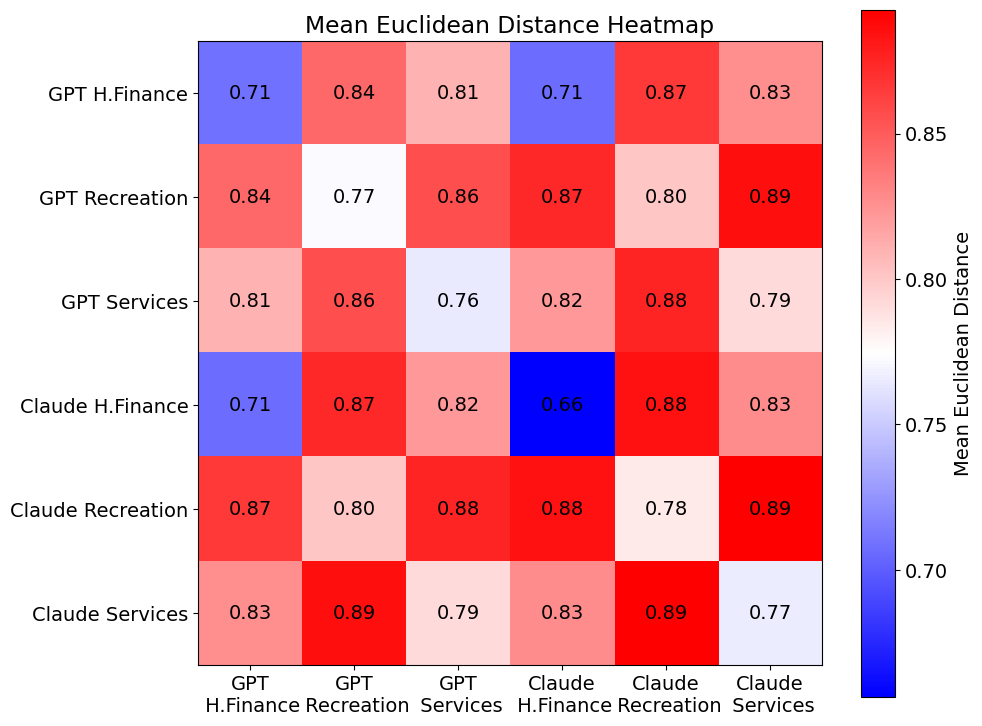

In [57]:
# Plot the heatmap
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 8))
plt.imshow(result, cmap='bwr', interpolation='nearest')
plt.title('Mean Euclidean Distance Heatmap')
plt.colorbar(label='Mean Euclidean Distance')

# Add text labels
for i in range(similarity_matrix.shape[0] // topic_len):  # row block
    for j in range(similarity_matrix.shape[1] // topic_len):  # column block
        plt.text(j, i, f"{result[i, j]:.2f}", ha='center', va='center', color='white' if result[i,j] < 0.5 else 'black')

plt.xticks(list(range(similarity_matrix.shape[1] // topic_len)), ['GPT\n H.Finance', 'GPT\n Recreation', 'GPT\n Services','Claude\n H.Finance','Claude\n Recreation','Claude\n Services'])
plt.yticks(list(range(similarity_matrix.shape[1] // topic_len)), ['GPT H.Finance', 'GPT Recreation', 'GPT Services','Claude H.Finance','Claude Recreation','Claude Services'])
plt.rcParams.update({'font.size': 12})
plt.tight_layout()
plt.show()

## Word Cloud

### Word cloud for Household Finance

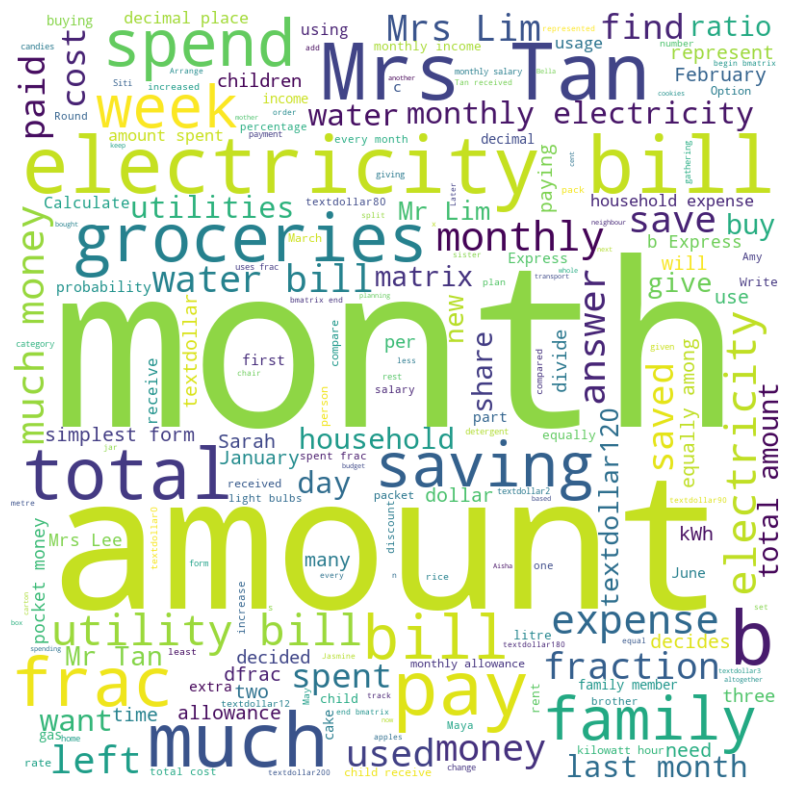

In [54]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Suppose `paragraphs` is your list of 176 paragraphs
text = " ".join(household_finance_list)

# Generate a word cloud object
wordcloud = WordCloud(width=800, height=800, background_color='white').generate(text)

# Display the generated image
plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

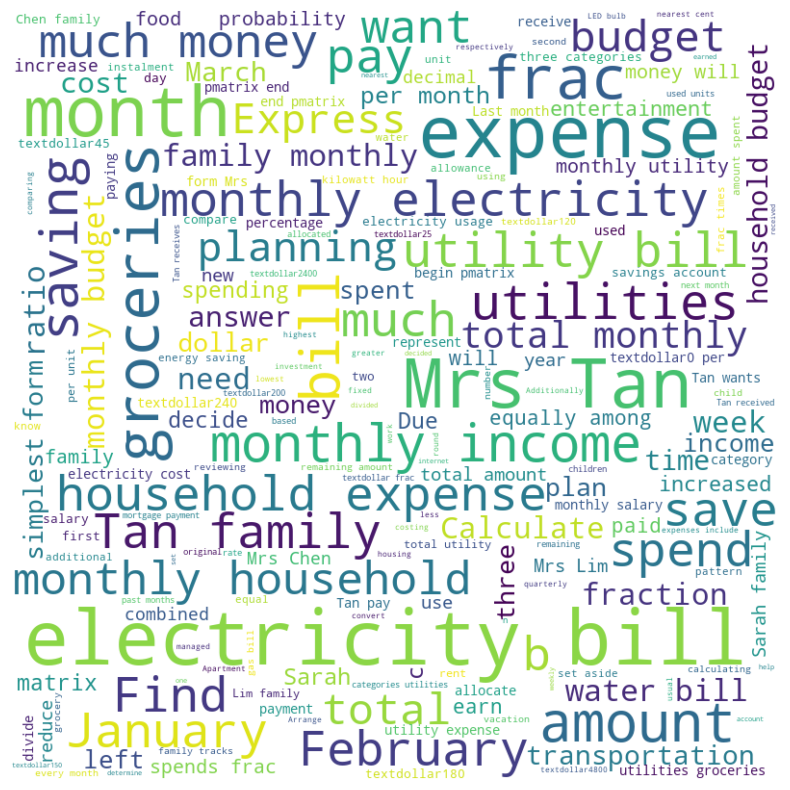

In [59]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Suppose `paragraphs` is your list of 176 paragraphs
text = " ".join(claude_household_finance_list)

# Generate a word cloud object
wordcloud = WordCloud(width=800, height=800, background_color='white').generate(text)

# Display the generated image
plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Word cloud for Services

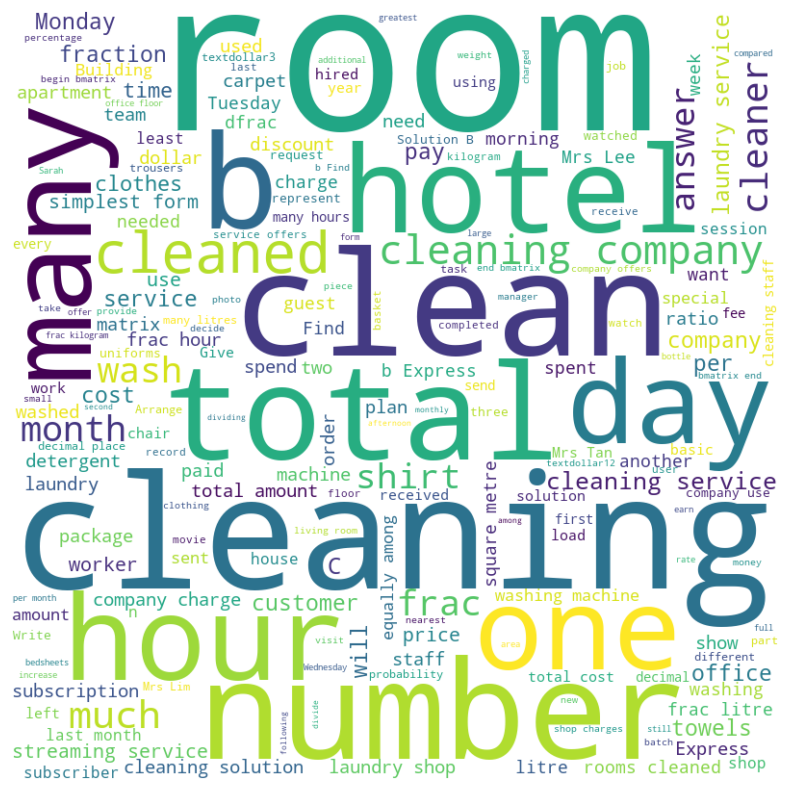

In [55]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Suppose `paragraphs` is your list of 176 paragraphs
text = " ".join(services_list)

# Generate a word cloud object
wordcloud = WordCloud(width=800, height=800, background_color='white').generate(text)

# Display the generated image
plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

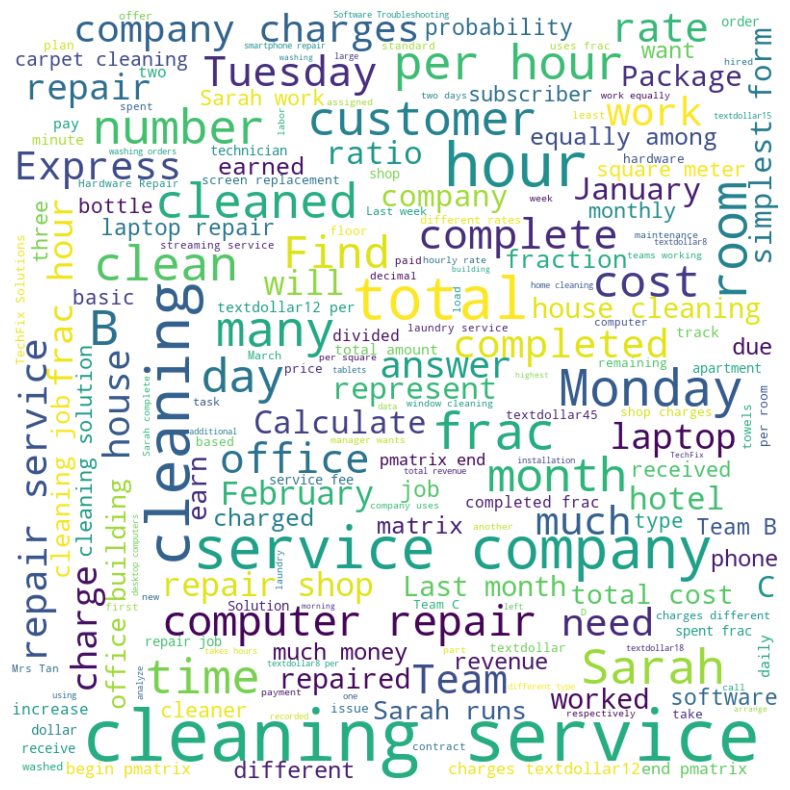

In [58]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Suppose `paragraphs` is your list of 176 paragraphs
text = " ".join(claude_services_list)

# Generate a word cloud object
wordcloud = WordCloud(width=800, height=800, background_color='white').generate(text)

# Display the generated image
plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Word cloud for Recreation

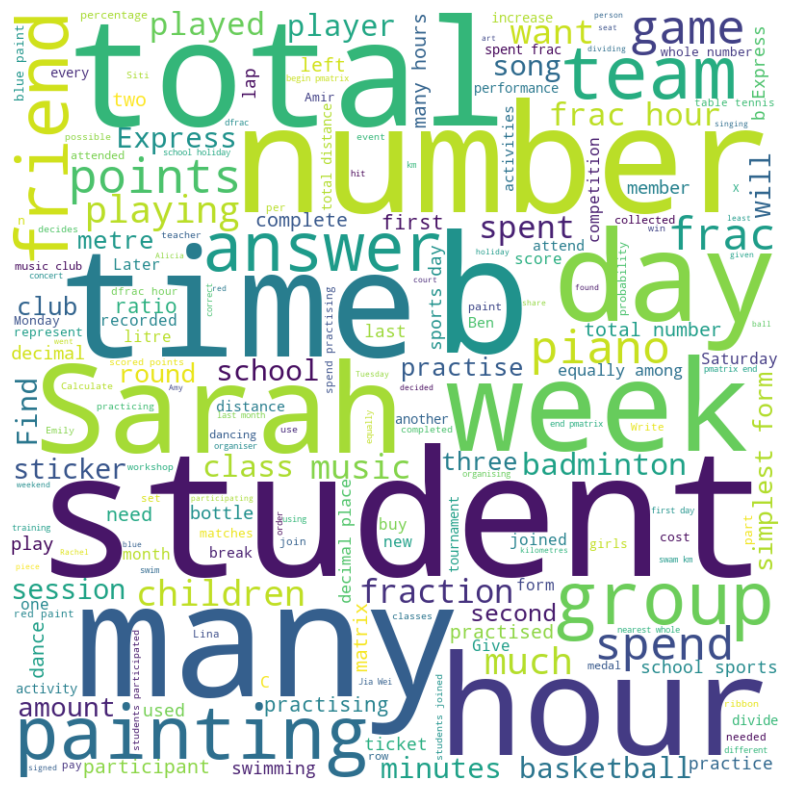

In [56]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Suppose `paragraphs` is your list of 176 paragraphs
text = " ".join(recreation_list)

# Generate a word cloud object
wordcloud = WordCloud(width=800, height=800, background_color='white').generate(text)

# Display the generated image
plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

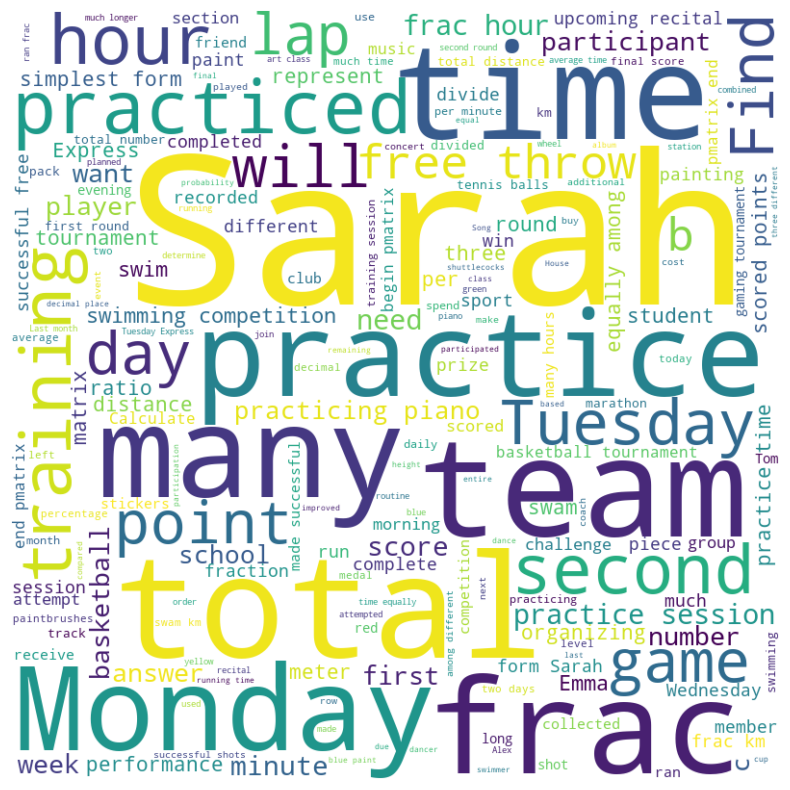

In [57]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Suppose `paragraphs` is your list of 176 paragraphs
text = " ".join(claude_recreation_list)

# Generate a word cloud object
wordcloud = WordCloud(width=800, height=800, background_color='white').generate(text)

# Display the generated image
plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## DBSCAN for sub-clustering

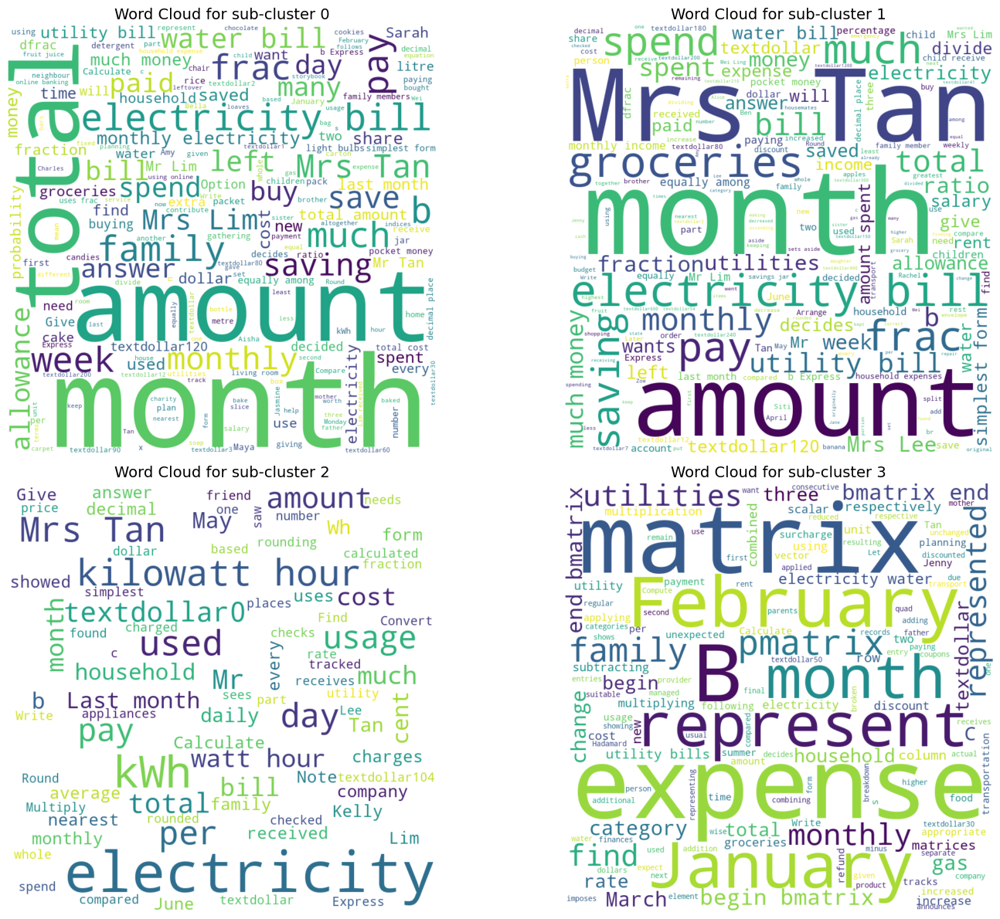

In [24]:
from sklearn.cluster import DBSCAN
from collections import defaultdict
from wordcloud import WordCloud

def dbscan_sub_cluster_wordcloud(encoded_vectors, question_list, eps):
    #Average euclidean distance is 0.77 ==> Which eps should we choose?
    cluster = DBSCAN(eps=eps, min_samples=5).fit(encoded_vectors)
    label = cluster.labels_
    
    # Initialize a dictionary to hold lists of sentences by label
    sub_cluster = defaultdict(list)
    
    # Group sentences by label
    for sentence, label in zip(question_list, label):
        sub_cluster[label].append(sentence)
    
    total_label_no = len(set(sub_cluster.keys()))
    rows_no = total_label_no//2 if total_label_no % 2 == 0 else total_label_no//2+1
    
    # Set up subplots: 2 rows x 2 columns
    fig, axes = plt.subplots(rows_no, 2, figsize=(16, 12))  # Adjust figsize as needed
    axes = axes.flatten()  # Flatten to easily index with a single loop
    
    # Generate and plot a word cloud for each list
    i = 0
    for key in sub_cluster.keys():
        text = " ".join(sub_cluster[key])
        wordcloud = WordCloud(width=800, height=800, background_color='white').generate(text)
        
        axes[i].imshow(wordcloud, interpolation='bilinear')
        axes[i].axis("off")
        axes[i].set_title(f"Word Cloud for sub-cluster {i}", fontsize=14)
        i += 1
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

    return cluster

household_finance_cluster = dbscan_sub_cluster_wordcloud(household_finance_vectors, household_finance_list, 0.5)

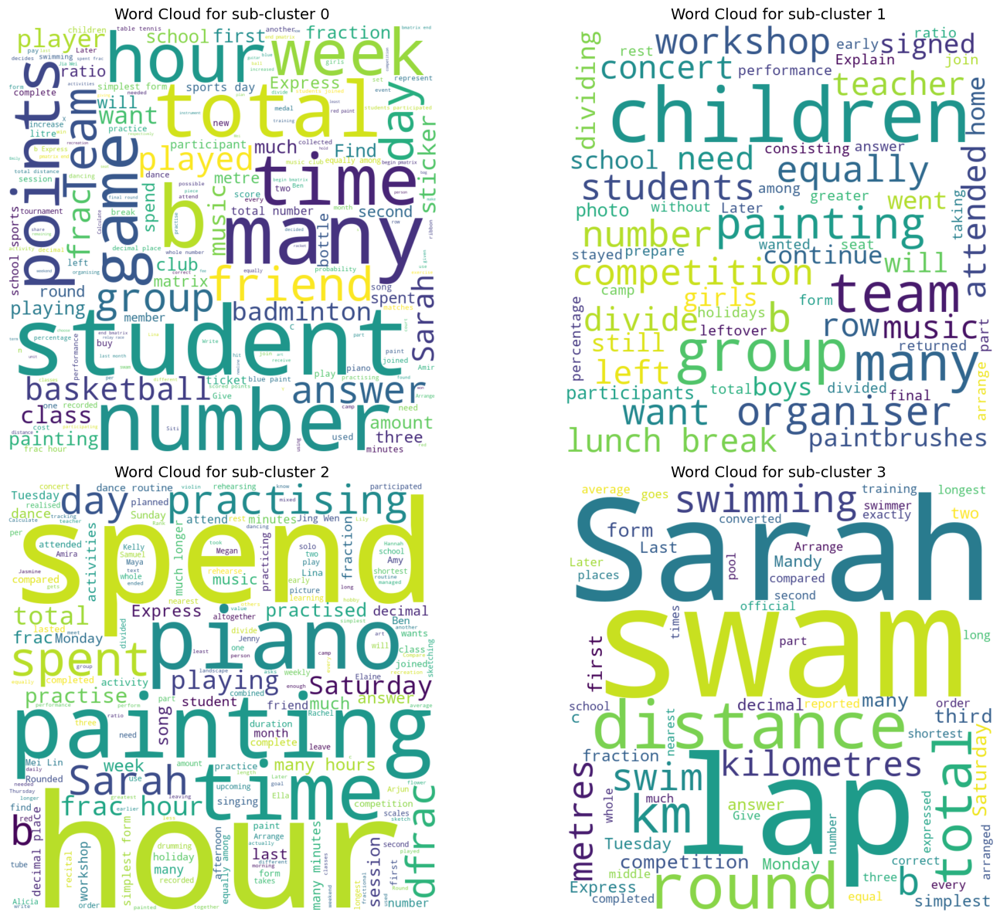

In [17]:
recreation_cluster = dbscan_sub_cluster_wordcloud(recreation_vectors, recreation_list)

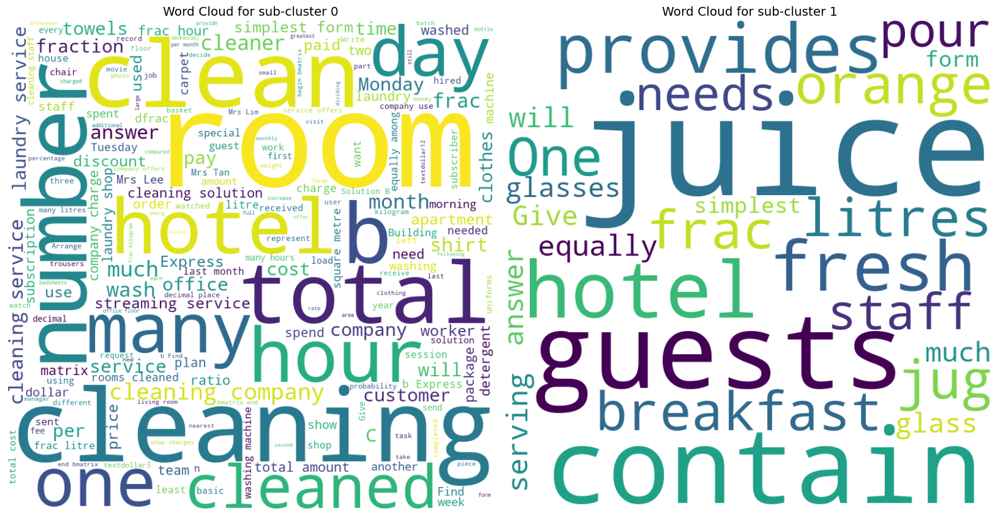

In [25]:
services_cluster = dbscan_sub_cluster_wordcloud(services_vectors, services_list, 0.7)

## HDBSCAN for sub-clustering

In [31]:
from sklearn.cluster import HDBSCAN
from collections import defaultdict

def hdbscan_sub_cluster_wordcloud(encoded_vectors, question_list):
    cluster = HDBSCAN(min_cluster_size = 3).fit(encoded_vectors)
    label = cluster.labels_
    
    # Initialize a dictionary to hold lists of sentences by label
    sub_cluster = defaultdict(list)
    
    # Group sentences by label
    for sentence, label in zip(question_list, label):
        sub_cluster[label].append(sentence)
    
    total_label_no = len(set(sub_cluster.keys()))
    rows_no = total_label_no//2 if total_label_no % 2 == 0 else total_label_no//2+1
    
    # Set up subplots: 2 rows x 2 columns
    fig, axes = plt.subplots(rows_no, 2, figsize=(16, 12))  # Adjust figsize as needed
    axes = axes.flatten()  # Flatten to easily index with a single loop
    
    # Generate and plot a word cloud for each list
    i = 0
    for key in sub_cluster.keys():
        text = " ".join(sub_cluster[key])
        wordcloud = WordCloud(width=800, height=800, background_color='white').generate(text)
        
        axes[i].imshow(wordcloud, interpolation='bilinear')
        axes[i].axis("off")
        axes[i].set_title(f"Word Cloud for sub-cluster {i}", fontsize=14)
        i += 1
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

    return cluster

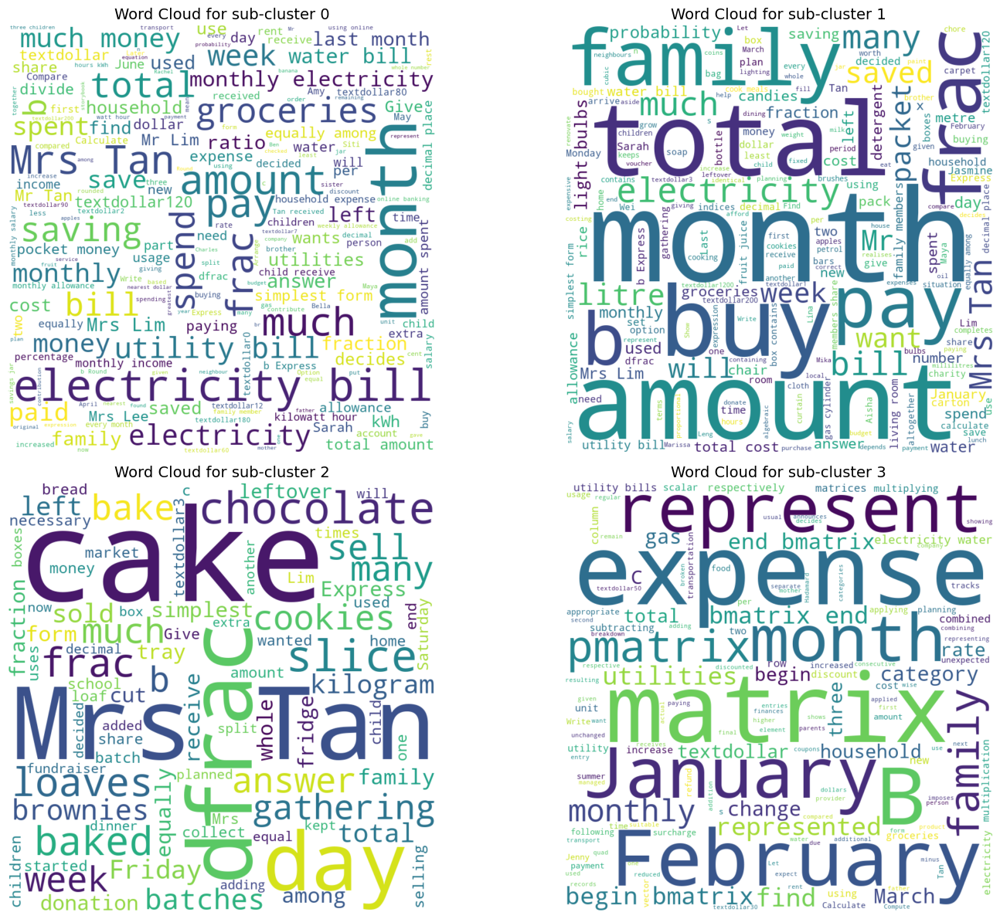

In [32]:
household_finance_cluster = hdbscan_sub_cluster_wordcloud(household_finance_vectors, household_finance_list)

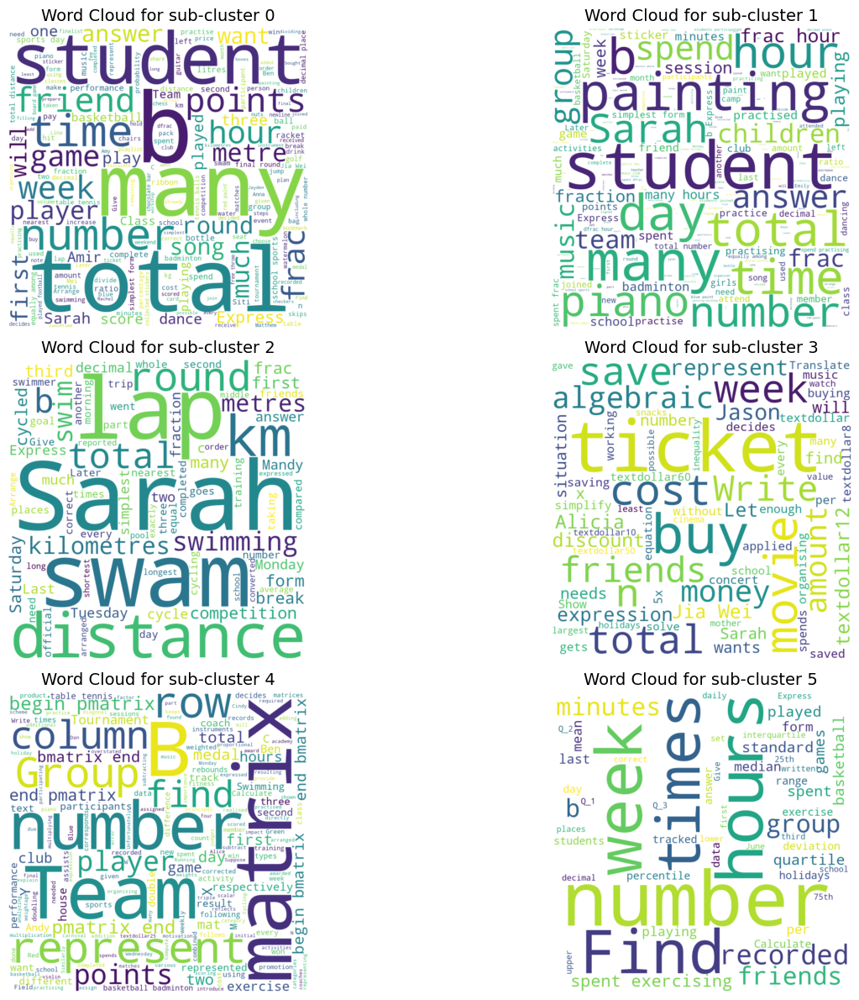

In [33]:
recreation_cluster = hdbscan_sub_cluster_wordcloud(recreation_vectors, recreation_list)

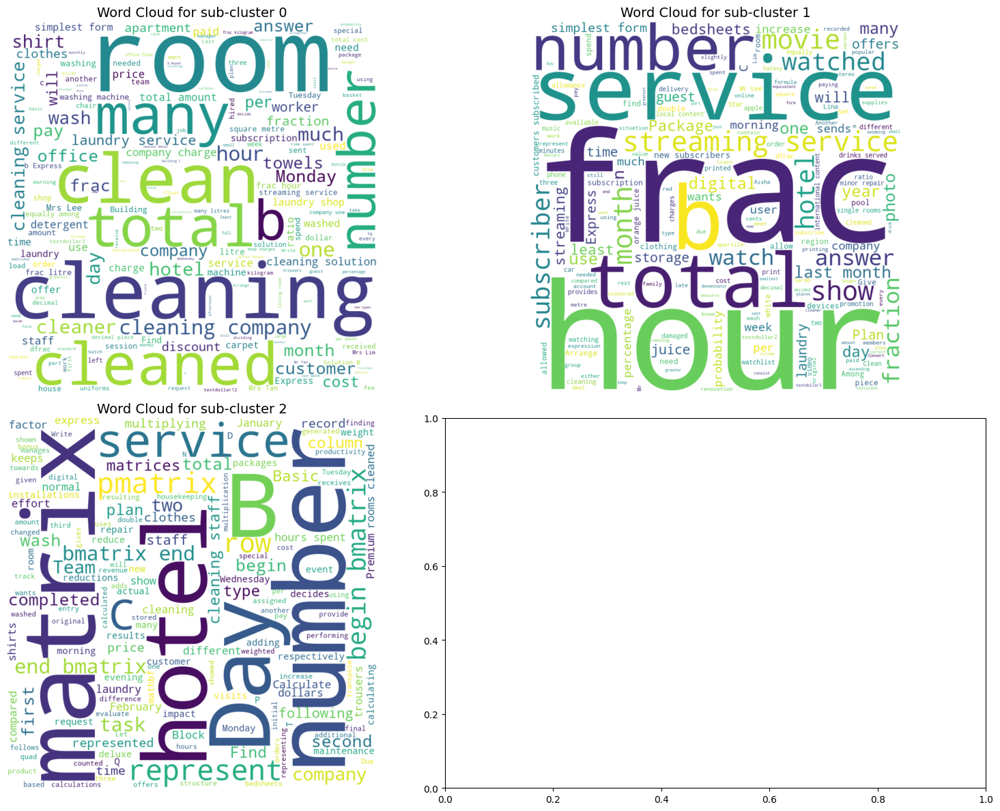

In [34]:
services_cluster = hdbscan_sub_cluster_wordcloud(services_vectors, services_list)

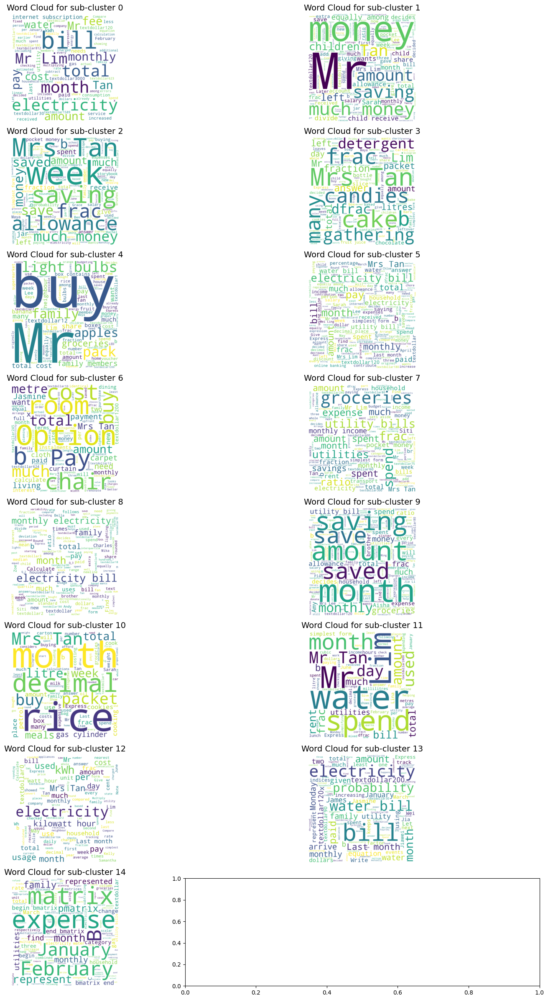

In [41]:
from sklearn.cluster import AgglomerativeClustering
from collections import defaultdict

def agglo_sub_cluster_wordcloud(encoded_vectors, question_list):
    #Average euclidean distance is 0.77 ==> Which eps should we choose?
    cluster = AgglomerativeClustering(n_clusters=None, distance_threshold = 1).fit(encoded_vectors)
    label = cluster.labels_
    
    # Initialize a dictionary to hold lists of sentences by label
    sub_cluster = defaultdict(list)
    
    # Group sentences by label
    for sentence, label in zip(question_list, label):
        sub_cluster[label].append(sentence)
    
    total_label_no = len(set(sub_cluster.keys()))
    rows_no = total_label_no//2 if total_label_no % 2 == 0 else total_label_no//2+1
    
    # Set up subplots: 2 rows x 2 columns
    fig, axes = plt.subplots(rows_no, 2, figsize=(16, 24))  # Adjust figsize as needed
    axes = axes.flatten()  # Flatten to easily index with a single loop
    
    # Generate and plot a word cloud for each list
    i = 0
    for key in sub_cluster.keys():
        text = " ".join(sub_cluster[key])
        wordcloud = WordCloud(width=800, height=800, background_color='white').generate(text)
        
        axes[i].imshow(wordcloud, interpolation='bilinear')
        axes[i].axis("off")
        axes[i].set_title(f"Word Cloud for sub-cluster {i}", fontsize=14)
        i += 1
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

    return cluster

household_finance_cluster = agglo_sub_cluster_wordcloud(household_finance_vectors, household_finance_list)

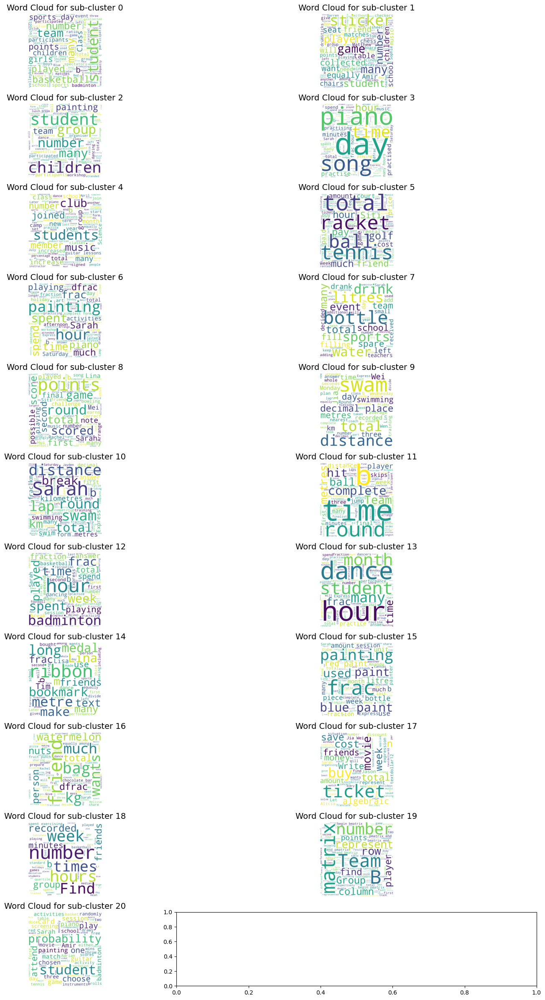

In [42]:
recreation_cluster = agglo_sub_cluster_wordcloud(recreation_vectors, recreation_list)

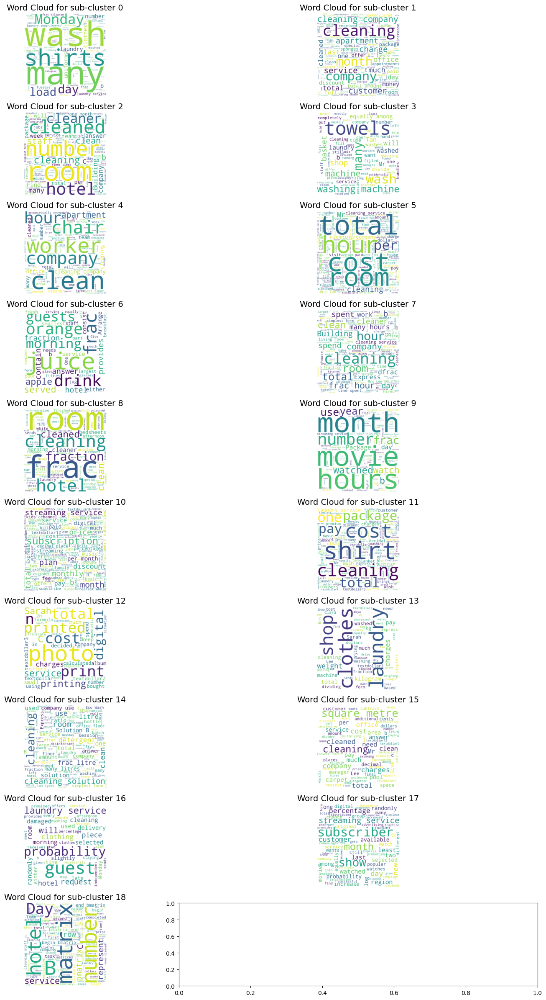

In [43]:
services_cluster = agglo_sub_cluster_wordcloud(services_vectors, services_list)